# Class-Conditional Synthesis with Latent Diffusion Models

Install all the requirements

In [1]:
#@title Installation
!git clone https://github.com/CompVis/latent-diffusion.git
!git clone https://github.com/CompVis/taming-transformers
!pip install -e ./taming-transformers
!pip install omegaconf>=2.0.0 pytorch-lightning>=1.0.8 torch-fidelity einops

import sys
sys.path.append(".")
sys.path.append('./taming-transformers')
from taming.models import vqgan 

Cloning into 'latent-diffusion'...
remote: Enumerating objects: 282, done.
remote: Total 282 (delta 0), reused 0 (delta 0), pack-reused 282
Receiving objects: 100% (282/282), 28.39 MiB | 39.88 MiB/s, done.
Resolving deltas: 100% (105/105), done.
Cloning into 'taming-transformers'...
remote: Enumerating objects: 1335, done.
remote: Total 1335 (delta 0), reused 0 (delta 0), pack-reused 1335
Receiving objects: 100% (1335/1335), 409.77 MiB | 42.20 MiB/s, done.
Resolving deltas: 100% (277/277), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/taming-transformers
  Running setup.py develop for taming-transformers


Now, download the checkpoint (~1.7 GB). This will usually take 1-2 minutes.

In [2]:
#@title Download
%cd latent-diffusion/ 

!mkdir -p models/ldm/cin256-v2/
!wget -O models/ldm/cin256-v2/model.ckpt https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt 

/content/latent-diffusion
--2022-06-10 23:03:34--  https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt
Resolving ommer-lab.com (ommer-lab.com)... 141.84.41.65
Connecting to ommer-lab.com (ommer-lab.com)|141.84.41.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1827378153 (1.7G)
Saving to: ‘models/ldm/cin256-v2/model.ckpt’

models/ldm/cin256-v 100%[===================>]   1.70G  28.0MB/s    in 64s     

2022-06-10 23:04:38 (27.4 MB/s) - ‘models/ldm/cin256-v2/model.ckpt’ saved [1827378153/1827378153]



Let's also check what type of GPU we've got.

In [3]:
!nvidia-smi

Fri Jun 10 23:04:53 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Load it.

In [4]:
#@title loading utils
import torch
from omegaconf import OmegaConf

from ldm.util import instantiate_from_config


def load_model_from_config(config, ckpt):
    print(f"Loading model from {ckpt}")
    pl_sd = torch.load(ckpt)#, map_location="cpu")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    model.cuda()
    model.eval()
    return model


def get_model():
    config = OmegaConf.load("configs/latent-diffusion/cin256-v2.yaml")  
    model = load_model_from_config(config, "models/ldm/cin256-v2/model.ckpt")
    return model

In [5]:
from ldm.models.diffusion.ddim import DDIMSampler

model = get_model()
sampler = DDIMSampler(model)

Loading model from models/ldm/cin256-v2/model.ckpt
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 400.92 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 3, 64, 64) = 12288 dimensions.
making attention of type 'vanilla' with 512 in_channels


And go. Quality, sampling speed and diversity are best controlled via the `scale`, `ddim_steps` and `ddim_eta` variables. As a rule of thumb, higher values of `scale` produce better samples at the cost of a reduced output diversity. Furthermore, increasing `ddim_steps` generally also gives higher quality samples, but returns are diminishing for values > 250. Fast sampling (i e. low values of `ddim_steps`) while retaining good quality can be achieved by using `ddim_eta = 0.0`.

In [9]:
range_classes = range(1,10)
print(list(range(1,10)))

[1, 2, 3, 4, 5, 6, 7, 8, 9]


rendering 1 examples of class '401' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.54it/s]


rendering 1 examples of class '402' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '403' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '404' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '405' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.48it/s]


rendering 1 examples of class '406' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.43it/s]


rendering 1 examples of class '407' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.41it/s]


rendering 1 examples of class '408' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.37it/s]


rendering 1 examples of class '409' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.30it/s]


rendering 1 examples of class '410' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.29it/s]


rendering 1 examples of class '411' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.29it/s]


rendering 1 examples of class '412' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.32it/s]


rendering 1 examples of class '413' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.37it/s]


rendering 1 examples of class '414' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.39it/s]


rendering 1 examples of class '415' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.45it/s]


rendering 1 examples of class '416' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.48it/s]


rendering 1 examples of class '417' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '418' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '419' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.52it/s]


rendering 1 examples of class '420' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '421' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '422' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '423' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '424' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '425' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.64it/s]


rendering 1 examples of class '426' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '427' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.65it/s]


rendering 1 examples of class '428' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '429' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.64it/s]


rendering 1 examples of class '430' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.65it/s]


rendering 1 examples of class '431' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '432' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.63it/s]


rendering 1 examples of class '433' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '434' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '435' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


rendering 1 examples of class '436' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '437' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '438' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.52it/s]


rendering 1 examples of class '439' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.48it/s]


rendering 1 examples of class '440' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.47it/s]


rendering 1 examples of class '441' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.42it/s]


rendering 1 examples of class '442' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.47it/s]


rendering 1 examples of class '443' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.49it/s]


rendering 1 examples of class '444' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.49it/s]


rendering 1 examples of class '445' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.47it/s]


rendering 1 examples of class '446' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.49it/s]


rendering 1 examples of class '447' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.49it/s]


rendering 1 examples of class '448' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.49it/s]


rendering 1 examples of class '449' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '450' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '451' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.55it/s]


rendering 1 examples of class '452' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.55it/s]


rendering 1 examples of class '453' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '454' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '455' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '456' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.60it/s]


rendering 1 examples of class '457' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '458' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '459' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '460' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '461' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '462' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.64it/s]


rendering 1 examples of class '463' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '464' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.62it/s]


rendering 1 examples of class '465' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '466' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '467' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


rendering 1 examples of class '468' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '469' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.55it/s]


rendering 1 examples of class '470' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.46it/s]


rendering 1 examples of class '471' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.54it/s]


rendering 1 examples of class '472' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '473' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.51it/s]


rendering 1 examples of class '474' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.51it/s]


rendering 1 examples of class '475' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '476' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '477' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.45it/s]


rendering 1 examples of class '478' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.51it/s]


rendering 1 examples of class '479' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '480' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.50it/s]


rendering 1 examples of class '481' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.52it/s]


rendering 1 examples of class '482' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.53it/s]


rendering 1 examples of class '483' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.54it/s]


rendering 1 examples of class '484' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.54it/s]


rendering 1 examples of class '485' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.55it/s]


rendering 1 examples of class '486' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.54it/s]


rendering 1 examples of class '487' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


rendering 1 examples of class '488' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


rendering 1 examples of class '489' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '490' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.59it/s]


rendering 1 examples of class '491' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '492' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '493' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


rendering 1 examples of class '494' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '495' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '496' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '497' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.58it/s]


rendering 1 examples of class '498' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.56it/s]


rendering 1 examples of class '499' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (1, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:02<00:00,  7.57it/s]


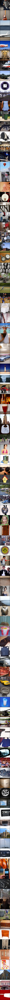

In [16]:
import numpy as np 
from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid


classes = [25, 187, 448, 992]   # define classes to be sampled here
classes = [400]
classes = list(range(401,500))
n_samples_per_class = 1

ddim_steps = 20
ddim_eta = 0.0
scale = 3.0   # for unconditional guidance


all_samples = list()

with torch.no_grad():
    with model.ema_scope():
        uc = model.get_learned_conditioning(
            {model.cond_stage_key: torch.tensor(n_samples_per_class*[1000]).to(model.device)}
            )
        
        for class_label in classes:
            print(f"rendering {n_samples_per_class} examples of class '{class_label}' in {ddim_steps} steps and using s={scale:.2f}.")
            xc = torch.tensor(n_samples_per_class*[class_label])
            c = model.get_learned_conditioning({model.cond_stage_key: xc.to(model.device)})
            
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples_per_class,
                                             shape=[3, 64, 64],
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc, 
                                             eta=ddim_eta)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, 
                                         min=0.0, max=1.0)
            all_samples.append(x_samples_ddim)


# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))